<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Scenario-1" data-toc-modified-id="Scenario-1-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Scenario 1</a></span></li></ul></div>

In [1]:
#!conda install geopandas
#!conda install geopy

#!pip install geopandas
#!#pip install geopy

In [4]:
!ls

Coordinates_Seehafen_adj.xlsx    Supply_trial2.xlsx
InterModalGermanyDataPrep.ipynb  Terminals_catchment_Germany.xlsx
NUTS_RG_03M_2021_4326            datensatzbeschreibung.xls
README.md                        gv-matrix-2025.csv


In [5]:
# load libraries
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import cartopy.crs as ccrs
# import seaborn as sns
import mapclassify
%config InlineBackend.figure_format = 'retina'

In [6]:
#Import demand file
colnames=['source', 'target', 'mode','goods','port', 'tons', 'tonskm']
dfg = pd.read_csv('gv-matrix-2025.csv', sep = ';', names=colnames, header=None)

#declare alpha columns
dfg['source'] = dfg['source'].astype(str)
dfg['target'] = dfg['target'].astype(str)
dfg['mode'] = dfg['mode'].astype(str)
dfg['goods'] = dfg['goods'].astype(str)
dfg['port'] = dfg['port'].astype(str)

#Create column for intermodal potential
dfg['pot'] = 0

#Apply 'potential' percentages
dfg.loc[dfg['goods'] == '0', 'pot'] = dfg['tons']/10 #10%
dfg.loc[dfg['goods'] == '1', 'pot'] = dfg['tons']/10 #10%
dfg.loc[dfg['goods'] == '4', 'pot'] = dfg['tons']/10 #10%
dfg.loc[dfg['goods'] == '5', 'pot'] = dfg['tons']/10 #10%
dfg.loc[dfg['goods'] == '6', 'pot'] = dfg['tons']/10 #10%
dfg.loc[dfg['goods'] == '8', 'pot'] = dfg['tons']/5  #20%
dfg.loc[dfg['goods'] == '9', 'pot'] = dfg['tons']/2  #50%

dfg['pot'] = dfg['pot'].astype(int)

#Zero fill codes
dfg['source'] = dfg['source'].str.zfill(5)
dfg['target'] = dfg['target'].str.zfill(5)

#combine codes to make unique key for grouping
dfg['sourcetarget'] = dfg['source']+dfg['target']

#sum by source target combination
dfg = dfg.groupby(dfg['sourcetarget']).sum()


dfg.reset_index(inplace=True)

#decode the grouping keys to codes

dfg['source'] = dfg['sourcetarget'].str[:5]

dfg['target'] = dfg['sourcetarget'].str[5:]

#Import NUTS3 regions
nuts = gpd.read_file('NUTS_RG_03M_2021_4326/NUTS_RG_03M_2021_4326.shp')
# https://ec.europa.eu/eurostat/web/gisco/geodata/reference-data/administrative-units-statistical-units/nuts#nuts2

#Import Demand data code book
dfd = pd.read_excel('/Users/maartenk/Downloads/datensatzbeschreibung.xls', sheet_name= 'Zonenliste',skiprows=3)

# make zonecode uniform to 5 digits with leading zero

dfd['Zonennummer'] = dfd['Zonennummer'].astype(str).str.zfill(5)

#Match zonenumber  and NUTS for source
dfgc = pd.merge(dfg, dfd, left_on=dfg['source'], 
                       right_on=dfd['Zonennummer'])

# rename column (to something unique)
dfgc['srcnuts'] = dfgc['Kürzel'].copy()   

#drop  original column
dfgc = dfgc.drop(['Kürzel'], axis=1)

dfgc = dfgc.drop(['key_0'], axis=1)

#Match zonenumber  and NUTS for target
dfgc = pd.merge(dfgc, dfd, left_on=dfgc['target'], 
                       right_on=dfd['Zonennummer'])


# rename column (to something unique)

dfgc['targetnuts'] = dfgc['Kürzel'].copy() 

#clean up
dfgc['srcdesc'] = dfgc['Beschreibung_x'].copy()
dfgc['targetdesc'] = dfgc['Beschreibung_y'].copy()
dfgc['srcnutslvl'] = dfgc['NUTS-Ebene_x'].copy()
dfgc['targetnutslvl'] = dfgc['NUTS-Ebene_y'].copy()
dfgc = dfgc.drop(['Kürzel','key_0',
                   'Beschreibung_x',
                   'Beschreibung_y', 
                   'Zonennummer_x',
                   'Zonennummer_y',
                   'sourcetarget',
                   'NUTS-Ebene_x',
                   'NUTS-Ebene_y',
                   'tonskm'], axis=1)

# Adjust to a CRS in Meters needed for radius calculation
nuts = nuts.to_crs(epsg=3035)

#define the middle of each NUTS region
nuts['centroid'] = nuts.centroid
#define radius of 50000 meters around the centroid
nuts['buffer'] = nuts.centroid.buffer(50000) #<<<==== ADJUST RADIUS HERE IN METERS

#Define plottable dataframe of the radii around the centroids
poly =  gpd.GeoDataFrame(nuts[['NUTS_ID', 'NAME_LATN', 'buffer']], geometry='buffer')

#Define plottable dataframe of the centroids
points =  gpd.GeoDataFrame(nuts[['NUTS_ID', 'NAME_LATN', 'centroid']], geometry='centroid')

#Add polygon (radius) to points
join_left_df = points.sjoin(poly, how="left")

#Add Seehafens to radius file

#read excel
df = pd.read_excel('Coordinates_Seehafen_adj.xlsx')

#https://geopandas.org/en/stable/gallery/create_geopandas_from_pandas.html (wkt = 'Well Known Text')
from shapely import wkt
#turn into geopandas geometry format
df['centroid'] = df['centroid'].apply(wkt.loads)
#create geodataframe
seehafen = gpd.GeoDataFrame(df, geometry = 'centroid', crs={'init': 'epsg:4326'})
#set crs
seehafen = seehafen.to_crs(epsg=3035)

#add to radii
join_left_df = join_left_df.append(seehafen, ignore_index=True)
#reaffrim as geopdataframe
join_left_df = gpd.GeoDataFrame(join_left_df, geometry='centroid')

#Import rail terminals
# df = pd.read_csv('/Users/maartenk/Downloads/Terminal_info.csv', delimiter=';')

# df = pd.read_excel('/Users/maartenk/Downloads/Terminal_NUTSlevel_EU.xlsx')#, delimiter=';', encoding='latin')

# df = pd.read_excel('/Users/maartenk/Downloads/Terminal_With_platz.xlsx')

df = pd.read_excel('Terminals_catchment_Germany.xlsx')


# terms = join_left_df.merge(df['Platz'], left_on=join_left_df['NUTS_ID_left'], right_on=df['Zone from'], how='left')

terms = join_left_df.merge(df[['Platz', 'Alternative']], left_on=join_left_df['NUTS_ID_left'], right_on=df['NUTS code from'], how='left')

finaltotal = pd.merge(left=dfgc,#[dfgc['srcnuts'] == 'DEG0P'], 
         right=join_left_df,
         left_on=dfgc['srcnuts'],
         right_on=join_left_df['NUTS_ID_right'],
            how='left')

finaltotal = finaltotal.drop(['key_0'], axis=1)

finaltotal = pd.merge(left=finaltotal, right=dfd, left_on = finaltotal['NUTS_ID_left'], right_on= dfd['Kürzel'], how='left')#.reset_index(drop=True)

finaltotal['servicesource'] = finaltotal['Kürzel']

finaltotal_ = finaltotal[['NAME_LATN_left', 'Zonennummer','NUTS_ID_left', 'NAME_LATN_right','source','NUTS_ID_right', 'targetdesc','target', 'targetnuts', 'pot']]#.to_excel('/Users/maartenk/Downloads/final.xls')

finaltotal_['comb'] = finaltotal_['Zonennummer'] + finaltotal_['target'] + finaltotal_['NAME_LATN_left']+'#'+finaltotal_['targetdesc']+'#'+finaltotal_['NUTS_ID_left']+'#'+finaltotal_['targetnuts']#.drop_duplicates()

finaltotal_g = finaltotal_.groupby(finaltotal_['comb']).sum().reset_index()#.to_excel('/Users/maartenk/Downloads/finaltotal.xls')

finaltotal_g['hinterland'] = finaltotal_g['comb'].str[:5]
finaltotal_g['target'] = finaltotal_g['comb'].str[5:10]
finaltotal_g['hintername'] = finaltotal_g['comb'].str[10:].str.split('#').str[0]
finaltotal_g['targetname'] = finaltotal_g['comb'].str[10:].str.split('#').str[1]
finaltotal_g['hinternuts'] = finaltotal_g['comb'].str[10:].str.split('#').str[2]
finaltotal_g['targetnuts'] = finaltotal_g['comb'].str[10:].str.split('#').str[3]

finaltotal_g['servicekey'] = finaltotal_g['hinterland']+finaltotal_g['target']

finaltotal_g_dest = finaltotal_g.copy()

finaltotal_g_dest = finaltotal_g_dest.merge(join_left_df, left_on='targetnuts', right_on='NUTS_ID_left', how='left')
# finaltotal_g_dest['hinterservice'] = finaltotal_g_dest['hinterland']+finaltotal_g_dest['Zonennummer']

finaltotal_g_dest = pd.merge(left=finaltotal_g_dest, right=dfd, left_on = finaltotal_g_dest['NUTS_ID_right'], right_on= dfd['Kürzel'], how='left').reset_index(drop=True)

finaltotal_g_dest['hinterservice'] = finaltotal_g_dest['hinterland']+finaltotal_g_dest['Zonennummer']

finaltotal_g_dest.drop(['key_0'], axis=1, inplace=True)

finaltotal_g_dest = finaltotal_g_dest.merge(finaltotal_g, left_on = finaltotal_g_dest['hinterservice'] , right_on = finaltotal_g['servicekey'], 
                   how='left').reset_index(drop=True)

finaltotal_g_dest_g = finaltotal_g_dest.groupby(['comb_x']).sum()

finaltotal_g_dest_g.reset_index(inplace=True)

finaltotal_g_dest_g['hinterland'] = finaltotal_g_dest_g['comb_x'].str[:5]
finaltotal_g_dest_g['serviceland'] = finaltotal_g_dest_g['comb_x'].str[5:10]
finaltotal_g_dest_g['hintername'] = finaltotal_g_dest_g['comb_x'].str[10:].str.split('#').str[0]
finaltotal_g_dest_g['servicename'] = finaltotal_g_dest_g['comb_x'].str[10:].str.split('#').str[1]
finaltotal_g_dest_g['hinternuts'] = finaltotal_g_dest_g['comb_x'].str[10:].str.split('#').str[2]
finaltotal_g_dest_g['servicenuts'] = finaltotal_g_dest_g['comb_x'].str[10:].str.split('#').str[3]
finaltotal_g_dest_g['IntModPot'] = finaltotal_g_dest_g['pot_y']

finaltotal_g_dest_g = finaltotal_g_dest_g[['hinternuts', 'servicenuts', 'hinterland', 'serviceland', 'hintername', 'servicename', 'IntModPot']][(finaltotal_g_dest_g['IntModPot'] > 100000) & (finaltotal_g_dest_g['hinternuts'] != finaltotal_g_dest_g['servicenuts'])]

finaltotal_g_dest_g['there'] = finaltotal_g_dest_g['hinterland']+finaltotal_g_dest_g['serviceland']
finaltotal_g_dest_g['return'] = finaltotal_g_dest_g['serviceland']+finaltotal_g_dest_g['hinterland']

finaltotal_g_dest_g_ = finaltotal_g_dest_g.copy()

finaltotal_g_dest_g = finaltotal_g_dest_g.merge(finaltotal_g_dest_g_['IntModPot'],
                          left_on=finaltotal_g_dest_g['return'], 
                          right_on=finaltotal_g_dest_g_['there'], 
                                    how ='left',
                         suffixes=(' there', ' return')).reset_index(drop=True)

finaltotal_g_dest_g.drop(['key_0'], axis=1, inplace=True)

#Supply side
file = 'Supply_trial2.xlsx'

# Read file
cargo = pd.read_excel(file)

# Adjust columns to standard
cargo['NutsCodeFrom'] = cargo['NUTS code from'].astype(str)
cargo['NutsCodeTo'] = cargo['NUTS code to'].astype(str)
cargo['ZoneFrom'] = cargo['Zone from'].astype(str).str.zfill(5)
cargo['ZoneTo'] = cargo['Zone to'].astype(str).str.zfill(5)
cargo['RegionFrom'] = cargo['NUTS region from']
cargo['RegionTo'] = cargo['NUTS region to']

#clean
cargo = cargo.drop(['Zone from', 'Zone to', 'NUTS code from', 'NUTS code to',
       'NUTS region from', 'NUTS region to'], axis=1)
cargo = cargo[cargo.columns[::-1]]

# Crete mapping key
cargo['cargocode'] =  cargo['ZoneFrom']+cargo['ZoneTo']

file = '/Users/maartenk/Downloads/Supply_data_final.xlsx'
cargo = pd.read_excel(file)

# Adjust columns to standard
cargo['NutsCodeFrom'] = cargo['NUTS code from'].astype(str)
cargo['NutsCodeTo'] = cargo['NUTS code to'].astype(str)
cargo['ZoneFrom'] = cargo['Zone from'].astype(str).str.zfill(5)
cargo['ZoneTo'] = cargo['Zone to'].astype(str).str.zfill(5)
cargo['RegionFrom'] = cargo['NUTS region from']
cargo['RegionTo'] = cargo['NUTS region to']

# clean
cargo = cargo.drop(['Zone from', 'Zone to', 'NUTS code from', 'NUTS code to',
       'NUTS region from', 'NUTS region to'], axis=1)
cargo = cargo[cargo.columns[::-1]]

# Create mapping key
cargo['cargocode'] =  cargo['ZoneFrom']+cargo['ZoneTo']

#sum duplicates
cargo = cargo.groupby(['RegionTo', 'RegionFrom', 'ZoneTo', 'ZoneFrom', 'NutsCodeTo',
       'NutsCodeFrom', 'cargocode']).sum().reset_index()



#display
# cargo.head()

#add Rail capacity supply to radiusfile
cargoservice = cargo.merge(join_left_df, left_on=cargo['NutsCodeFrom'], right_on=join_left_df['NUTS_ID_left'], how='inner', indicator=True)

#Merge Geoframe and supply data on source code
finalcargo = pd.merge(left=join_left_df, 
         right=cargo,#[dfgc['srcnuts'] == 'DEG0P'],
         left_on=join_left_df['NUTS_ID_right'],
         right_on=cargo['NutsCodeFrom'],
          how='left')


finalcargo_ = finalcargo[['NUTS_ID_left', 'NAME_LATN_left', 'centroid',
       'NUTS_ID_right', 'NAME_LATN_right', 'NutsCodeTo',
       'ZoneTo', 'RegionTo', 'AnnualCargoCapacity']]#[(finalcargo['NUTS_ID_left'] == 'DEA31') & (finalcargo['AnnualCargoCapacity'] >0)]#.sort_values('ZoneTo')

#add zone code
finalcargo__ = pd.merge(left=finalcargo_, right=dfd['Zonennummer'], left_on = finalcargo_['NUTS_ID_left'], right_on= dfd['Kürzel'], how='left')

#create grouping key for summation (inserting # for splitting purposes later)

# finaltotal_['comb'] = 
finalcargo__['comb'] = finalcargo__['Zonennummer'] + finalcargo__['ZoneTo'] + finalcargo__['NAME_LATN_left']+'#'+finalcargo__['RegionTo']+'#'+finalcargo__['NUTS_ID_left']+'#'+finalcargo__['NutsCodeTo']#.drop_duplicates()


# Sum freight potential per service source and destination
finalcargo_g = finalcargo__.groupby(finalcargo__['comb']).sum().reset_index()
#Untangle grouping key
finalcargo_g['hinterland'] = finalcargo_g['comb'].str[:5]
finalcargo_g['target'] = finalcargo_g['comb'].str[5:10]
finalcargo_g['hintername'] = finalcargo_g['comb'].str[10:].str.split('#').str[0]
finalcargo_g['targetname'] = finalcargo_g['comb'].str[10:].str.split('#').str[1]
finalcargo_g['hinternuts'] = finalcargo_g['comb'].str[10:].str.split('#').str[2]
finalcargo_g['targetnuts'] = finalcargo_g['comb'].str[10:].str.split('#').str[3]

finalcargo_g['servicekey'] = finalcargo_g['hinterland']+finalcargo_g['target']

finalcargo_g_dest = finalcargo_g.copy()

# add nuts3 areas within 50km radius op destination centroid
# this includes the Seehafens centroids but NOT polygons so no service area.

finalcargo_g_dest = finalcargo_g_dest.merge(join_left_df, left_on='targetnuts', right_on='NUTS_ID_left', how='outer')

#add nuts3 codes for destination
finalcargo_g_dest = pd.merge(left=finalcargo_g_dest, right=dfd, left_on = finalcargo_g_dest['NUTS_ID_right'], right_on= dfd['Kürzel'], how='left').reset_index(drop=True)

# create service key for destination centroids
finalcargo_g_dest['hinterservice'] = finalcargo_g_dest['hinterland']+finalcargo_g_dest['Zonennummer']



finalcargo_g_dest.drop(['key_0'], axis=1, inplace=True)

finalcargo_g_dest = finalcargo_g_dest.merge(finalcargo_g, left_on = finalcargo_g_dest['hinterservice'] , right_on = finalcargo_g['servicekey'], 
                   how='left').reset_index(drop=True)

finalcargo_g_dest_g = finalcargo_g_dest.groupby(['comb_x']).sum().reset_index()

finalcargo_g_dest_g['hinterland'] = finalcargo_g_dest_g['comb_x'].str[:5]
finalcargo_g_dest_g['serviceland'] = finalcargo_g_dest_g['comb_x'].str[5:10]
finalcargo_g_dest_g['hintername'] = finalcargo_g_dest_g['comb_x'].str[10:].str.split('#').str[0]
finalcargo_g_dest_g['servicename'] = finalcargo_g_dest_g['comb_x'].str[10:].str.split('#').str[1]
finalcargo_g_dest_g['hinternuts'] = finalcargo_g_dest_g['comb_x'].str[10:].str.split('#').str[2]
finalcargo_g_dest_g['servicenuts'] = finalcargo_g_dest_g['comb_x'].str[10:].str.split('#').str[3]
finalcargo_g_dest_g['R2RCapacity'] = finalcargo_g_dest_g['AnnualCargoCapacity_y']



finalcargo_g_dest_g = finalcargo_g_dest_g[['hinternuts', 
                                           'servicenuts', 
                                           'hinterland', 
                                           'serviceland', 
                                           'hintername', 
                                           'servicename', 
                                           'R2RCapacity']][finalcargo_g_dest_g['R2RCapacity']>0]

#add Rail capacity supply
finaltotal_g_dest_g = finaltotal_g_dest_g.merge(cargo['AnnualCargoCapacity'], left_on=finaltotal_g_dest_g['there'], right_on=cargo['cargocode'], how='left', indicator=True)

finaltotal_g_dest_g.drop(['key_0'], axis=1, inplace=True)

# add centroid for source centroids
finaltotal_g_dest_g = finaltotal_g_dest_g.merge(join_left_df['centroid'], 
                                                left_on = finaltotal_g_dest_g['hinternuts'], 
                                                right_on = join_left_df['NUTS_ID_left'], 
                                                how='left')

finaltotal_g_dest_g = finaltotal_g_dest_g.drop_duplicates()

#rename to something more meaningful
finaltotal_g_dest_g['hintercentroid'] = finaltotal_g_dest_g['centroid']

finaltotal_g_dest_g.drop(['key_0'], axis=1, inplace=True)

# Add centroid for destination centre
finaltotal_g_dest_g = finaltotal_g_dest_g.merge(join_left_df['centroid'],
                                                left_on = finaltotal_g_dest_g['servicenuts'], 
                                                right_on = join_left_df['NUTS_ID_left'], 
                                                how='left')

finaltotal_g_dest_g = finaltotal_g_dest_g.drop_duplicates()

finaltotal_g_dest_g.drop(['key_0'], axis=1, inplace=True)

#rename to something meaningful
finaltotal_g_dest_g['servicecentroid'] = finaltotal_g_dest_g['centroid_y']

#turn into GeoPandas Dataframe
finaltotal_g_dest_g = gpd.GeoDataFrame(finaltotal_g_dest_g, crs=3035, geometry=finaltotal_g_dest_g['servicecentroid'])

#calculate euclidian distance
finaltotal_g_dest_g['distance'] = finaltotal_g_dest_g['servicecentroid'].distance(finaltotal_g_dest_g['hintercentroid']).astype(int)

#Add region to region supply capacity
finaltotal_g_dest_g = finaltotal_g_dest_g.merge(finalcargo_g_dest_g['R2RCapacity'], 
                          left_on=finaltotal_g_dest_g['hinterland']+finaltotal_g_dest_g['serviceland'],
                          right_on=finalcargo_g_dest_g['hinterland']+finalcargo_g_dest_g['serviceland'],
                          how='left').reset_index(drop=True)

#create column to show capacity supply from periphery
finaltotal_g_dest_g['From Region Capacity'] = finalcargo_g_dest_g['R2RCapacity'].fillna(0)-finaltotal_g_dest_g['AnnualCargoCapacity'].fillna(0)

finaltotal_g_dest_g.drop(['key_0'], axis=1, inplace=True)

#re-create dfgc to be able to add tons and potential
dfgc = pd.merge(dfg, dfd, left_on=dfg['source'], 
                       right_on=dfd['Zonennummer']).reset_index(drop=True)

dfgc.drop(['key_0'], axis=1, inplace=True)

# finaltotal_g_dest_g.drop(['key_0'], axis=1, inplace=True)

# Merge to add Point to Point actual total demand and potential intermodal demand
finaltotal_g_dest_g = finaltotal_g_dest_g.merge(dfgc[['tons','pot']], 
                          left_on=finaltotal_g_dest_g['hinterland']+finaltotal_g_dest_g['serviceland'],
                          right_on=dfgc['sourcetarget'],
                          how='left')
finaltotal_g_dest_g.drop(['key_0'], axis=1, inplace=True)

# Merge to add name of terminal to hinter nuts if present
finaltotal_g_dest_g = finaltotal_g_dest_g.merge(terms['Platz'],
                          left_on=finaltotal_g_dest_g['hinternuts'], 
                          right_on=terms['NUTS_ID_left'], how='left',
                         ).drop_duplicates().reset_index(drop=True)
finaltotal_g_dest_g['from terminal'] = finaltotal_g_dest_g['Platz']
finaltotal_g_dest_g.drop(['key_0'], axis=1, inplace=True)
finaltotal_g_dest_g.drop(['Platz'], axis=1, inplace=True)

# Merge to add name of terminal to service nuts if present
finaltotal_g_dest_g = finaltotal_g_dest_g.merge(terms['Platz'],
                          left_on=finaltotal_g_dest_g['servicenuts'], 
                          right_on=terms['NUTS_ID_left'], how='left',
                         ).drop_duplicates().reset_index(drop=True)

finaltotal_g_dest_g['to terminal'] = finaltotal_g_dest_g['Platz']
finaltotal_g_dest_g.drop(['key_0'], axis=1, inplace=True)
finaltotal_g_dest_g.drop(['Platz'], axis=1, inplace=True)

# finaltotal_g_dest_g[['hinternuts', 'servicenuts', 'hinterland', 'serviceland', 'hintername',
#        'servicename', 'IntModPot there', 'there', 'return', 'IntModPot return',
#        'AnnualCargoCapacity', 'distance']][finaltotal_g_dest_g['distance']>200000].to_excel('/Users/maartenk/Downloads/finalgrt200k_.xlsx')

#rename columns for clarity
finaltotal_g_dest_g = finaltotal_g_dest_g.rename(columns = {'IntModPot there':'R2RPotential there',
                                       'IntModPot return':'R2RPotential return',
                                       'AnnualCargoCapacity':'P2PCapacity', 
                                       'distance':'P2PEuclDistance (mtr)', 
                                       'tons':'P2PActForecast', 
                                       'pot':'P2PPotential'}).copy()
#define Geopandas dataframe
finaltotal_g_dest_g =finaltotal_g_dest_g[['hintername', 'servicename',
      'R2RPotential there', 'R2RPotential return', 'R2RCapacity', 'From Region Capacity',
      'P2PActForecast', 'P2PPotential',
      'P2PCapacity',  'P2PEuclDistance (mtr)','from terminal', 'to terminal', 'hinternuts', 'servicenuts', 
      'hinterland', 'serviceland','there', 'return',
       'hintercentroid', 'servicecentroid', 'geometry']]

finaltotal_g_dest_g['dup'] = finaltotal_g_dest_g['R2RPotential there'] + finaltotal_g_dest_g['R2RPotential return']

finaltotal_g_dest_g = finaltotal_g_dest_g[finaltotal_g_dest_g['dup'].isnull() | ~finaltotal_g_dest_g[finaltotal_g_dest_g['dup'].notnull()].duplicated(subset='dup',keep='first')]

#export to excel
finaltotal_g_dest_g[finaltotal_g_dest_g['P2PEuclDistance (mtr)']>300000].to_excel('finalgrt300k_nodup.xlsx')

/Users/maartenk/opt/anaconda3/envs/geo_env/lib/python3.10/site-packages/pyproj/crs/crs.py:130: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/var/folders/qv/232gv52d2ql2tjf70n472lwm0000gq/T/ipykernel_16423/2188811799.py:124: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  join_left_df = join_left_df.append(seehafen, ignore_index=True)
/var/folders/qv/232gv52d2ql2tjf70n472lwm0000gq/T/ipykernel_16423/2188811799.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/p

In [7]:
!ls

Coordinates_Seehafen_adj.xlsx    Terminals_catchment_Germany.xlsx
InterModalGermanyDataPrep.ipynb  datensatzbeschreibung.xls
NUTS_RG_03M_2021_4326            finalgrt300k_nodup.xlsx
README.md                        gv-matrix-2025.csv
Supply_trial2.xlsx


In [83]:
dfg_ = pd.read_csv('/Users/maartenk/Downloads/gv-matrix-2025.csv', sep = ';', names=colnames, header=None)

In [84]:
dfg_.shape

(972526, 7)

In [85]:
dfg.shape

(242926, 6)

In [55]:
finaltotal.shape

(2355990, 22)

In [80]:
finaltotal[finaltotal['pot'] > 0].shape

(2323103, 22)

In [61]:
finaltotal_g_dest_g.shape

(76098, 10)

In [87]:
finaltotal_g_dest_g.shape#[finaltotal_g_dest_g['IntModPot there'] >= 100000 ].shape

(238479, 12)

In [69]:
finaltotal_g_dest_g[finaltotal_g_dest_g['IntModPot there'] >= 100000 ].shape

(76098, 10)

In [74]:
finaltotal_g_dest_g[finaltotal_g_dest_g['P2PEuclDistance (mtr)']>300000].shape

(12157, 22)

In [7]:
finaltotal_g_dest_g.to_pickle('/Users/maartenk/Downloads/finaltotal_g_dest_g.pkl')

In [138]:
finaltotal_g_dest_g = pd.read_pickle('/Users/maartenk/Downloads/finaltotal_g_dest_g.pkl')

In [3]:
finaltotal_g_dest_g.columns

Index(['hintername', 'servicename', 'R2RPotential there',
       'R2RPotential return', 'R2RCapacity', 'From Region Capacity',
       'P2PActForecast', 'P2PPotential', 'P2PCapacity',
       'P2PEuclDistance (mtr)', 'from terminal', 'to terminal', 'hinternuts',
       'servicenuts', 'hinterland', 'serviceland', 'there', 'return',
       'hintercentroid', 'servicecentroid', 'geometry', 'dup'],
      dtype='object')

In [13]:
finaltotal_g_dest_g[(finaltotal_g_dest_g['from terminal'].notnull()) & (finaltotal_g_dest_g['to terminal'].notnull()) & (
                    finaltotal_g_dest_g['R2RCapacity'].notnull())].to_excel('/Users/maartenk/Downloads/GijsSpecial.xlsx')

In [4]:
majors = ['03152',
'14285',
'14365',
'15202',
'15261',
'08336',
'08317',
'08335',
'24188',
'24228',
'02118',
'04128',
'03528',
'01148',
'03404',
'03251',
'03456',
'03454',
'06632',
'06611',
'06634',
'06636',
'26394',
'26391',
'02000',
'03359',
'04011',
'03352',
'01004',
'09661',
'06412',
'06533',
'07315',
'06433',
'07314',
'08222',
'07334',
'07319',
'24188',
'10045',
'25101',
'28252',
'28251',
'28255',
'28254',
'28253',
'05913',
'05112',
'05111',
'05915',
'05916',
'05124',
'05316',
'05162',
'05362',
'05978',
'05170',
'05114',
'05166',
'05974',
'05315',
'05970',
'05154',
'11000',
'12072',
'12061',
'12053',
'12066',
'08111',
'08118',
'08121',
'08425',
'08135',
'09362',
'09376',
'09377',
'29301',
'26222',
'26221',
'26234',
'26233',
'26231',
'26212',
'26213',
'16056',
'14262',
'16051',
'24126',
'24124',
'24273',
'24147',
'24271',
'24148',
'24274',
'24149',
'24272',
'24231',
'24210',
'24233',
'09373',
'09564',
'09461',
'09662',
'09464',
'03241',
'03358',
'09161',
'09162',
'09261',
'09279',
'09761',
'28437',
'28431',
'28436',
'28434',
'28431',
'28433',
'26145',
'26141',
'26144',
'26143',
'26142',
'26146',
'28301',
'27101',
'09163',
'09262',
'09171']

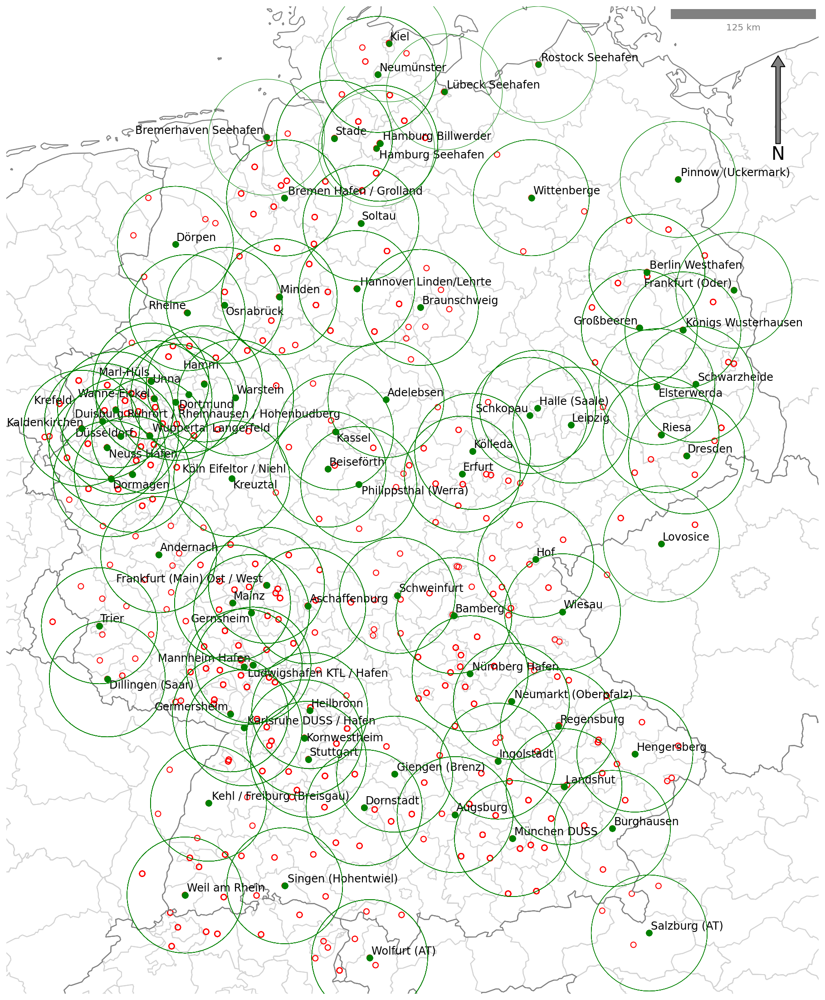

In [92]:
from adjustText import adjust_text
inradii = list(terms['NUTS_ID_left'][terms['Platz'].notnull()])

fig, ax = plt.subplots(figsize=(20, 20)
                      )
nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')

finalcargo[(finalcargo['AnnualCargoCapacity'] >0) & (finalcargo['NUTS_ID_right'].isin(inradii))].plot(fc='none',ec='red',lw=1,ax=ax)


terms[terms['Platz'].notnull()].plot(ax=ax, c='green', zorder=99)
terms[terms['Platz'].notnull()].buffer(50000).plot(ax=ax, fc='none',ec='green', zorder=99 ,lw=.5)


nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'grey', ax=ax)

ax.set_xlim(4000000,4700000)
ax.set_ylim(2650000,3500000)



texts=[]

for x, y, label in zip(terms[(terms['Platz'].notnull()) & (terms['NUTS_ID_left'] == terms['NUTS_ID_right'])].centroid.x, 
                       terms[(terms['Platz'].notnull()) & (terms['NUTS_ID_left'] == terms['NUTS_ID_right'])].centroid.y, 
                       terms[(terms['Platz'].notnull()) & (terms['NUTS_ID_left'] == terms['NUTS_ID_right'])].Platz):
                        texts.append(plt.text(x, y, label, fontsize = 12))

adjust_text(texts)  

ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)

ax.axis('off')

plt.show()


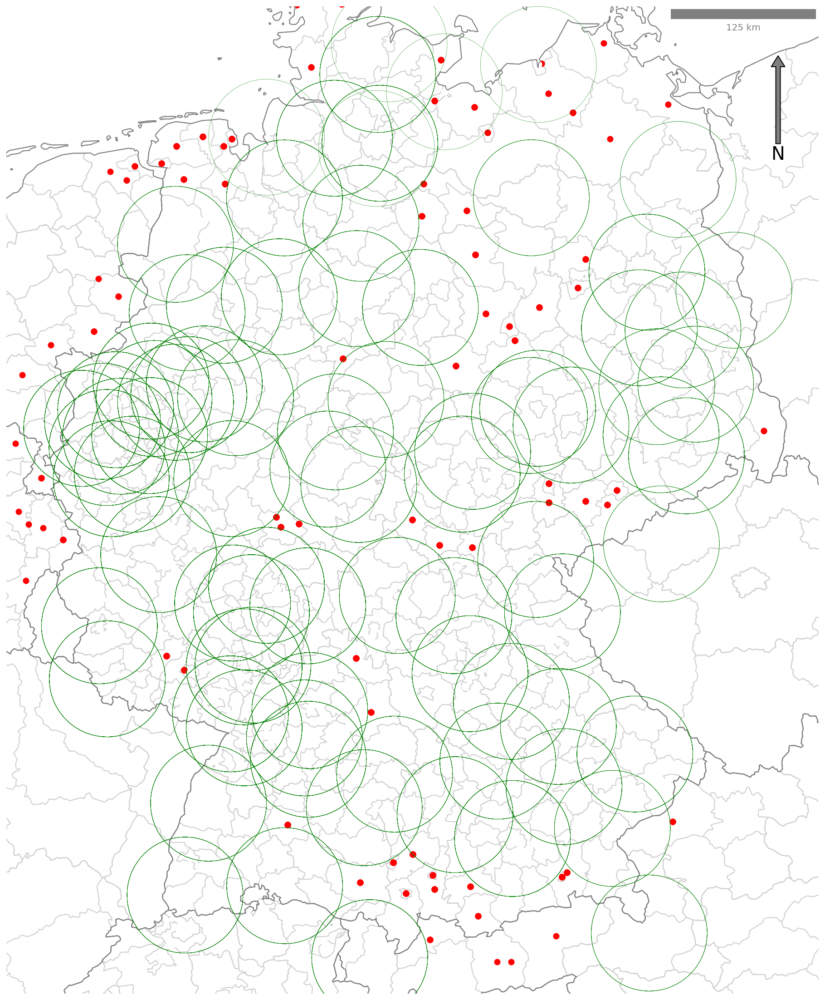

''

In [102]:
from adjustText import adjust_text
inradii = list(terms['NUTS_ID_left'][terms['Platz'].notnull()])

outradii = list(terms['NUTS_ID_left'][(terms['Platz'].isnull()) & (
    terms['NUTS_ID_left'] == terms['NUTS_ID_right']) & (
    terms['key_0'].str.len() == 5) & (terms['NUTS_ID_right'].str[:2]=='DE')])

outradii = list(set(outradii))

fig, ax = plt.subplots(figsize=(20, 20)
                      )
nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')

terms[terms['Platz'].notnull()].buffer(50000).plot(ax=ax, fc='none',ec='green', zorder=99 ,lw=.25)

terms[terms['NUTS_ID_right'].isin(outradii)].plot(ax=ax, c='red')
terms[terms['NUTS_ID_right'].isin(inradii)].plot(ax=ax, markersize=50, c='white')

nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'grey', ax=ax)

ax.set_xlim(4000000,4700000)
ax.set_ylim(2650000,3500000)

ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
ax.axis('off')


plt.show()


In [8]:
majors_ = finalcargo['NUTS_ID_right'][finalcargo['ZoneFrom'].isin(majors)].tolist()

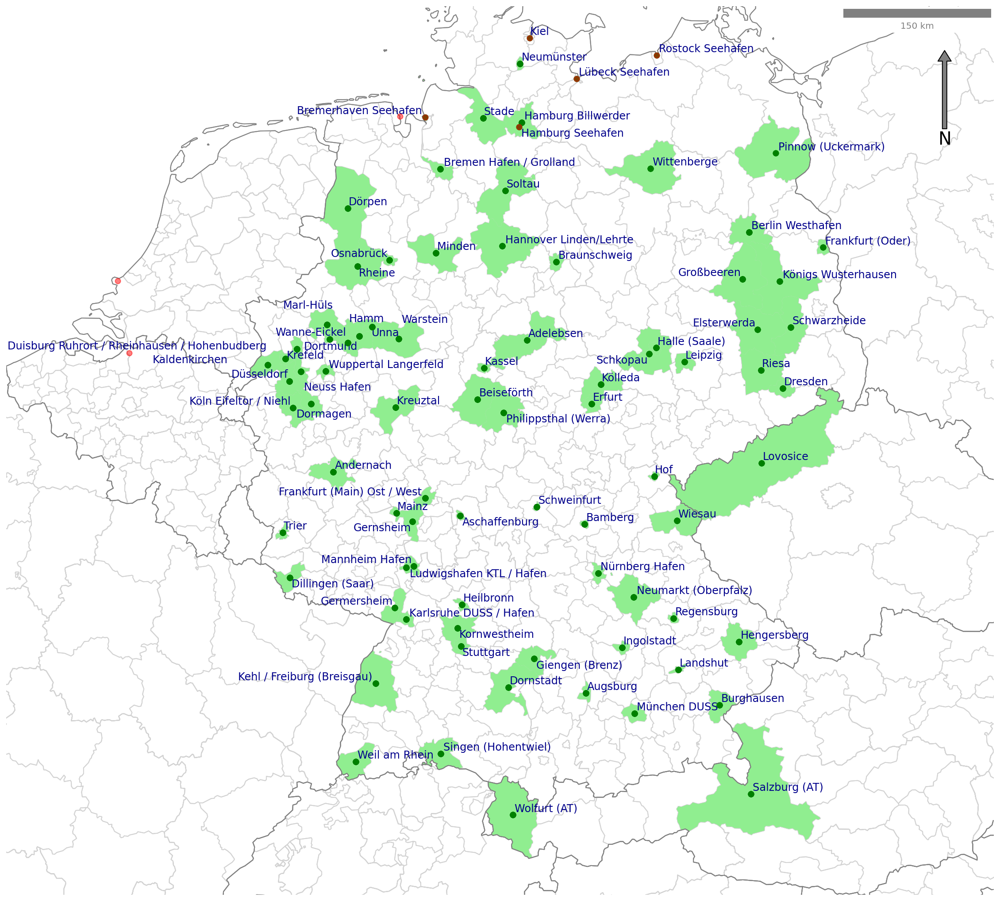

In [26]:
from adjustText import adjust_text
inradii = list(terms['NUTS_ID_left'][terms['Platz'].notnull()])

fig, ax = plt.subplots(figsize=(20, 20)
                      )
nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')

nuts[nuts['NUTS_ID'].isin(temp)].plot(ax=ax, fc='lightgreen')


terms[terms['Platz'].notnull()].plot(ax=ax, c='green', zorder=98)
# terms[terms['Platz'].notnull()].buffer(50000).plot(ax=ax, fc='none',ec='green', zorder=99 ,lw=.5)
seehafen.plot(ax=ax, c='red', zorder=98, alpha=.5)


nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'grey', ax=ax)



ax.set_xlim(3800000,4800000)
ax.set_ylim(2600000,3500000)



texts=[]

for x, y, label in zip(terms[(terms['Platz'].notnull()) & (terms['NUTS_ID_left'] == terms['NUTS_ID_right'])].centroid.x, 
                       terms[(terms['Platz'].notnull()) & (terms['NUTS_ID_left'] == terms['NUTS_ID_right'])].centroid.y, 
                       terms[(terms['Platz'].notnull()) & (terms['NUTS_ID_left'] == terms['NUTS_ID_right'])].Platz):
                        texts.append(plt.text(x, y, label, fontsize =12, c='darkblue'))

adjust_text(texts)  

ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
ax.axis('off')


plt.show()
               


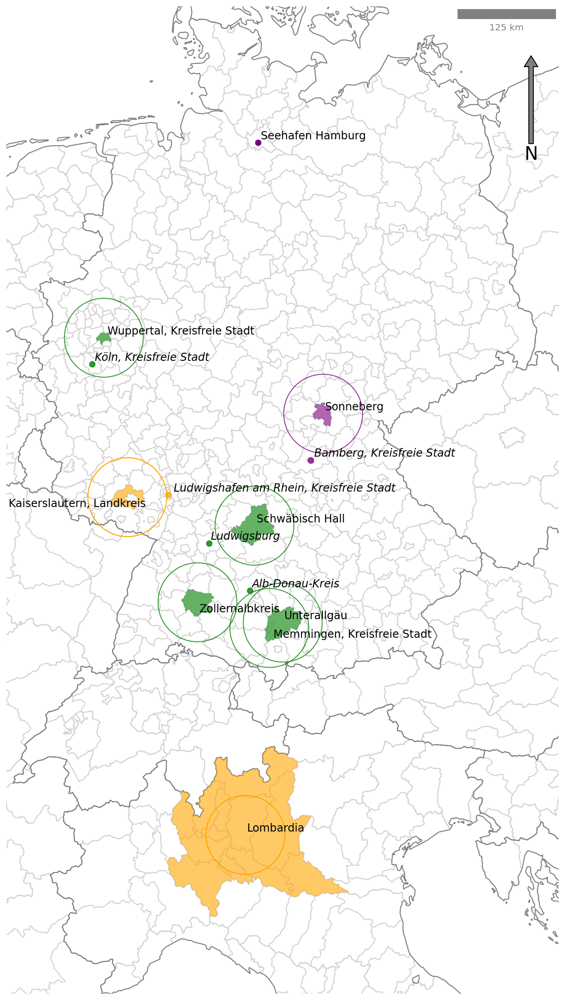

In [237]:
fig, ax = plt.subplots(figsize=(20, 20))
nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')
# seehafen.plot(ax=ax, c='red', zorder=98, alpha=.5)
nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'grey', ax=ax)

nuts[nuts['NUTS_ID'].isin(['DEB3F','ITC4'])].plot(ax=ax, fc='orange', alpha=.6)

points[points['NUTS_ID'].isin(['DEB3F','ITC4'])].buffer(50000).plot(ax=ax, 
                                                                     ec='orange',
                                                                    fc='none',
                                                                    alpha=.8)
points[points['NUTS_ID'].isin(['DEB3F','ITC4'])].buffer(50000).plot(ax=ax, 
                                                                     ec='orange',
                                                                    fc='none',
                                                                    alpha=.8)
points[points['NUTS_ID'].isin(['DEB34'])].plot(ax=ax, 
                                                                     ec='orange',
                                                                    fc='orange',
                                                                    alpha=.8)
nuts[nuts['NUTS_ID'].isin(['DEA1A','DE143', 'DE274', 'DE27C', 'DE11A'])].plot(ax=ax, fc='green', alpha=.6)
points[points['NUTS_ID'].isin(['DEA23', 'DE145', 'DE115'])].plot(ax=ax, 
                                                                     ec='green',
                                                                    fc='green',
                                                                    alpha=.8)
points[points['NUTS_ID'].isin(['DEA1A','DE143', 'DE274', 'DE27C', 'DE11A'])].buffer(50000).plot(ax=ax, 
                                                                     ec='green',
                                                                    fc='none',
                                                                    alpha=.8)
# nuts[nuts['NUTS_ID'].isin(['DE600','DEA23'])].plot(ax=ax, fc='purple', alpha=.6)
seehafen[seehafen['NUTS_ID_left'].isin(['SHHH'])].plot(ax=ax, fc='purple', ec='purple')

nuts[nuts['NUTS_ID'].isin(['DEG0H'])].plot(ax=ax, fc='purple', alpha=.6)
points[points['NUTS_ID'].isin(['DE241'])].plot(ax=ax, 
                                                                     ec='purple',
                                                                    fc='purple',
                                                                    alpha=.8)
points[points['NUTS_ID'].isin(['DEG0H'])].buffer(50000).plot(ax=ax, 
                                                                     ec='purple',
                                                                    fc='none',
                                                                    alpha=.8)



ax.set_xlim(4000000,4700000)
ax.set_ylim(2300000,3550000)

texts=[]

for x, y, label in zip(points[points['NUTS_ID'].isin(['DEB34', 'DEA23', 'DE241', 'DE115', 'DE145'])].centroid.x, 
                       points[points['NUTS_ID'].isin(['DEB34', 'DEA23', 'DE241', 'DE115', 'DE145'])].centroid.y, 
                       points[points['NUTS_ID'].isin(['DEB34', 'DEA23', 'DE241', 'DE115', 'DE145'])].NAME_LATN):
                        texts.append(plt.text(x, y, label, fontsize = 12, style='italic'))

# texts=[]

for x, y, label in zip(points[points['NUTS_ID'].isin(['DEB3F','ITC4', 'DEA1A','DE143', 'DE274', 'DE27C', 'DE11A', 'DEG0H'])].centroid.x, 
                       points[points['NUTS_ID'].isin(['DEB3F','ITC4', 'DEA1A','DE143', 'DE274', 'DE27C', 'DE11A', 'DEG0H'])].centroid.y, 
                       points[points['NUTS_ID'].isin(['DEB3F','ITC4', 'DEA1A','DE143', 'DE274', 'DE27C', 'DE11A', 'DEG0H'])].NAME_LATN):
                        texts.append(plt.text(x, y, label, fontsize = 12))
        
for x, y, label in zip(seehafen[seehafen['NUTS_ID_left'].isin(['SHHH'])].centroid.x, 
                       seehafen[seehafen['NUTS_ID_left'].isin(['SHHH'])].centroid.y, 
                       seehafen[seehafen['NUTS_ID_left'].isin(['SHHH'])].NAME_LATN_left):
                        texts.append(plt.text(x, y, label, fontsize = 12))
    
adjust_text(texts)

ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
ax.axis('off')


plt.show()
               





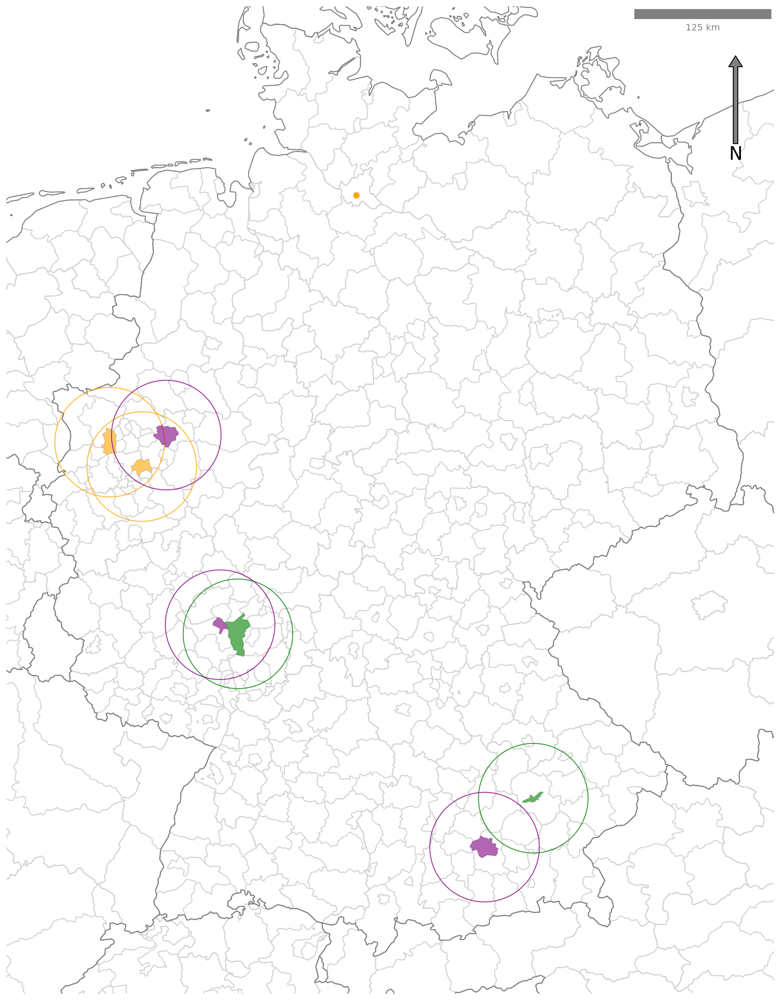

In [163]:
fig, ax = plt.subplots(figsize=(20, 20))
nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')
# seehafen.plot(ax=ax, c='red', zorder=98, alpha=.5)
nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'grey', ax=ax)

nuts[nuts['NUTS_ID'].isin(['DEA1A','DEA12', 'SHHH'])].plot(ax=ax, fc='orange', alpha=.6)
seehafen[seehafen['NUTS_ID_left'].isin(['SHHH'])].plot(ax=ax, fc='orange', ec='orange')
points[points['NUTS_ID'].isin(['DEA1A', 'DEA12', 'SHHH'])].buffer(50000).plot(ax=ax, 
                                                                     ec='orange',
                                                                    fc='none',
                                                                    alpha=.8)

nuts[nuts['NUTS_ID'].isin(['DE717', 'DE221'])].plot(ax=ax, fc='green', alpha=.6)

points[points['NUTS_ID'].isin(['DE717', 'DE221'])].buffer(50000).plot(ax=ax, 
                                                                     ec='green',
                                                                    fc='none',
                                                                    alpha=.8)

nuts[nuts['NUTS_ID'].isin(['DE212', 'DEA52', 'DEB35'])].plot(ax=ax, fc='purple', alpha=.6)

points[points['NUTS_ID'].isin(['DE212', 'DEA52', 'DEB35'])].buffer(50000).plot(ax=ax, 
                                                                     ec='purple',
                                                                    fc='none',
                                                                    alpha=.8)



ax.set_xlim(4000000,4700000)
ax.set_ylim(2650000,3550000)



ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
ax.axis('off')


plt.show()
               





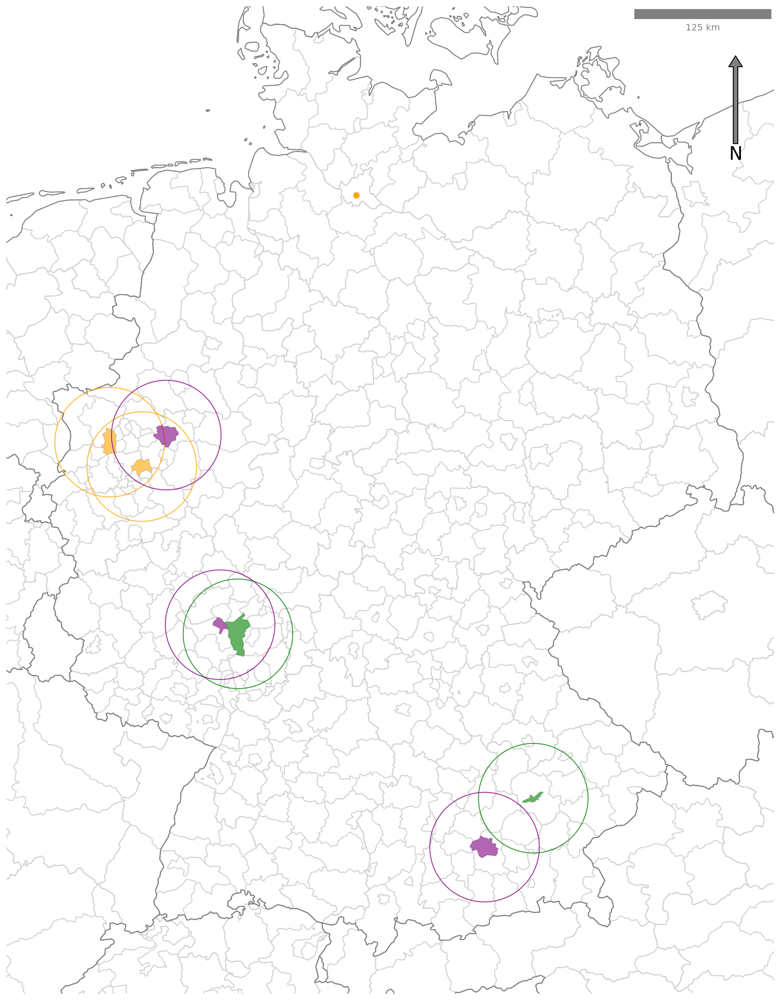

In [163]:
fig, ax = plt.subplots(figsize=(20, 20))
nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')
# seehafen.plot(ax=ax, c='red', zorder=98, alpha=.5)
nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'grey', ax=ax)

nuts[nuts['NUTS_ID'].isin(['DEA1A','DEA12', 'SHHH'])].plot(ax=ax, fc='orange', alpha=.6)
seehafen[seehafen['NUTS_ID_left'].isin(['SHHH'])].plot(ax=ax, fc='orange', ec='orange')
points[points['NUTS_ID'].isin(['DEA1A', 'DEA12', 'SHHH'])].buffer(50000).plot(ax=ax, 
                                                                     ec='orange',
                                                                    fc='none',
                                                                    alpha=.8)

nuts[nuts['NUTS_ID'].isin(['DE717', 'DE221'])].plot(ax=ax, fc='green', alpha=.6)

points[points['NUTS_ID'].isin(['DE717', 'DE221'])].buffer(50000).plot(ax=ax, 
                                                                     ec='green',
                                                                    fc='none',
                                                                    alpha=.8)

nuts[nuts['NUTS_ID'].isin(['DE212', 'DEA52', 'DEB35'])].plot(ax=ax, fc='purple', alpha=.6)

points[points['NUTS_ID'].isin(['DE212', 'DEA52', 'DEB35'])].buffer(50000).plot(ax=ax, 
                                                                     ec='purple',
                                                                    fc='none',
                                                                    alpha=.8)



ax.set_xlim(4000000,4700000)
ax.set_ylim(2650000,3550000)



ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
ax.axis('off')


plt.show()
               





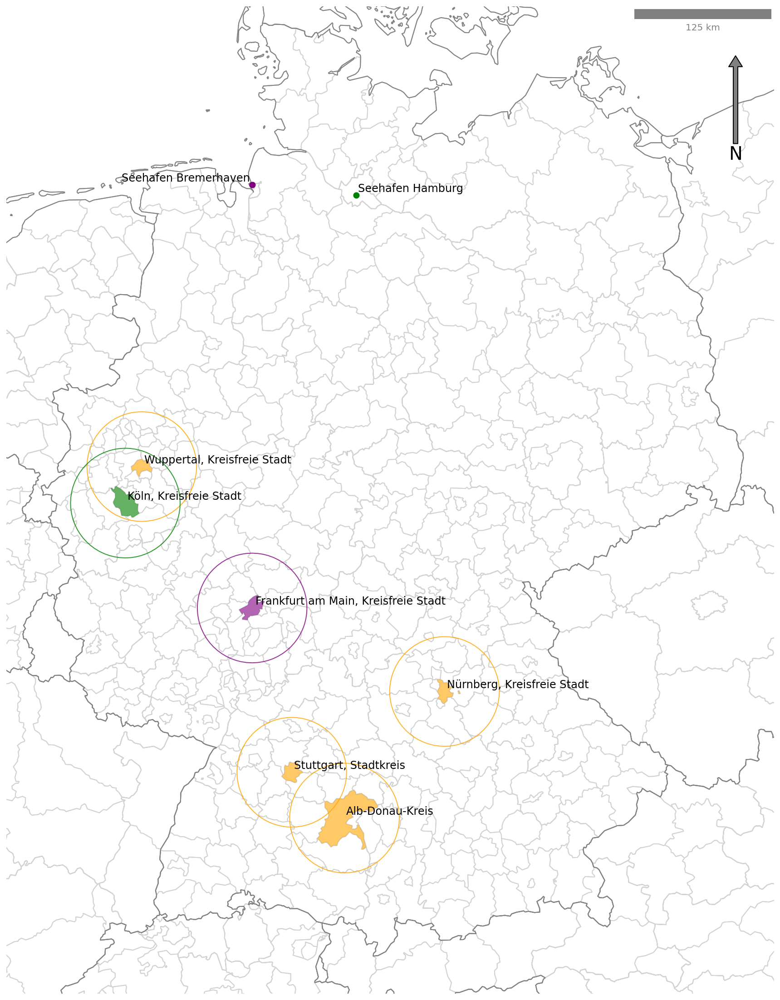

In [177]:
fig, ax = plt.subplots(figsize=(20, 20))
nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')
# seehafen.plot(ax=ax, c='red', zorder=98, alpha=.5)
nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'grey', ax=ax)

nuts[nuts['NUTS_ID'].isin(['DEA1A','DE111', 'DE254','DE145'])].plot(ax=ax, fc='orange', alpha=.6)
points[points['NUTS_ID'].isin(['DEA1A','DE111', 'DE254','DE145'])].buffer(50000).plot(ax=ax, 
                                                                     ec='orange',
                                                                    fc='none',
                                                                    alpha=.8)

nuts[nuts['NUTS_ID'].isin(['DEA23'])].plot(ax=ax, fc='green', alpha=.6)
seehafen[seehafen['NUTS_ID_left'].isin(['SHHH'])].plot(ax=ax, fc='green', ec='green')
points[points['NUTS_ID'].isin(['DEA23'])].buffer(50000).plot(ax=ax, 
                                                                     ec='green',
                                                                    fc='none',
                                                                    alpha=.8)

nuts[nuts['NUTS_ID'].isin(['DE712'])].plot(ax=ax, fc='purple', alpha=.6)
seehafen[seehafen['NUTS_ID_left'].isin(['SHBH'])].plot(ax=ax, fc='purple', ec='purple')
points[points['NUTS_ID'].isin(['DE712'])].buffer(50000).plot(ax=ax, 
                                                                     ec='purple',
                                                                    fc='none',
                                                                    alpha=.8)



ax.set_xlim(4000000,4700000)
ax.set_ylim(2650000,3550000)



texts=[]

for x, y, label in zip(points[points['NUTS_ID'].isin(['DEA1A','DE111', 'DE254','DE145', 'DE712','DEA23'])].centroid.x, 
                       points[points['NUTS_ID'].isin(['DEA1A','DE111', 'DE254','DE145', 'DE712','DEA23'])].centroid.y, 
                       points[points['NUTS_ID'].isin(['DEA1A','DE111', 'DE254','DE145', 'DE712','DEA23'])].NAME_LATN):
                        texts.append(plt.text(x, y, label, fontsize = 12))
        
for x, y, label in zip(seehafen[seehafen['NUTS_ID_left'].isin(['SHHH', 'SHBH'])].centroid.x, 
                       seehafen[seehafen['NUTS_ID_left'].isin(['SHHH', 'SHBH'])].centroid.y, 
                       seehafen[seehafen['NUTS_ID_left'].isin(['SHHH', 'SHBH'])].NAME_LATN_left):
                        texts.append(plt.text(x, y, label, fontsize = 12))
        
adjust_text(texts)

ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
ax.axis('off')


plt.show()
               





In [145]:
seehafen

,NUTS_ID_left,NAME_LATN_left,centroid,index_right,NUTS_ID_right,NAME_LATN_right
0,SHHH,Seehafen Hamburg,POINT (4318871.511 3377705.415),2118,SHHH,Seehafen Hamburg
1,SHBH,Seehafen Bremerhaven,POINT (4224111.519 3387373.829),4128,SHBH,Seehafen Bremerhaven
2,SHKI,Seehafen Kiel,POINT (4329802.834 3467828.404),1138,SHKI,Seehafen Kiel
3,SHHL,Seehafen Lübeck,POINT (4377309.118 3426464.227),1148,SHHL,Seehafen Lübeck
4,SHHRO,Seehafen Rostock,POINT (4458470.735 3450058.709),13128,SHHRO,Seehafen Rostock
5,SHANT,Seehafen Antwerpen,POINT (3924185.325 3148765.550),24228,SHANT,Seehafen Antwerpen
6,SHWHV,Seehafen Wilhelmshaven,POINT (4198365.834 3388447.216),3528,SHWHV,Seehafen Wilhelmshaven
7,SHROT,Seehafen Rotterdam,POINT (3912810.020 3221483.658),24188,SHROT,Seehafen Rotterdam


In [6]:
# Create subset for testing purposes
wartburg = join_left_df['NUTS_ID_right'].loc[(join_left_df['NUTS_ID_left'] == 'DEG0P') & (join_left_df['NUTS_ID_right'] != 'DE')]

In [7]:
# Create subset for testing purposes
munich= join_left_df['NUTS_ID_right'].loc[(join_left_df['NUTS_ID_left'] == 'DE212') & (~join_left_df['NUTS_ID_right'].isin(['DE', 'DE21']))]

In [8]:
# Create subset for testing purposes
hamburg= join_left_df['NUTS_ID_right'].loc[(join_left_df['NUTS_ID_left'] == 'DE600') & (~join_left_df['NUTS_ID_right'].isin(['DE93', 'DE6', 'DE60']))]

In [7]:
hamburg

9909    DE600
9911    DE939
9912    DEF06
9913    DEF09
9914    DEF0F
9915    DEF0D
9917    DE933
Name: NUTS_ID_right, dtype: object

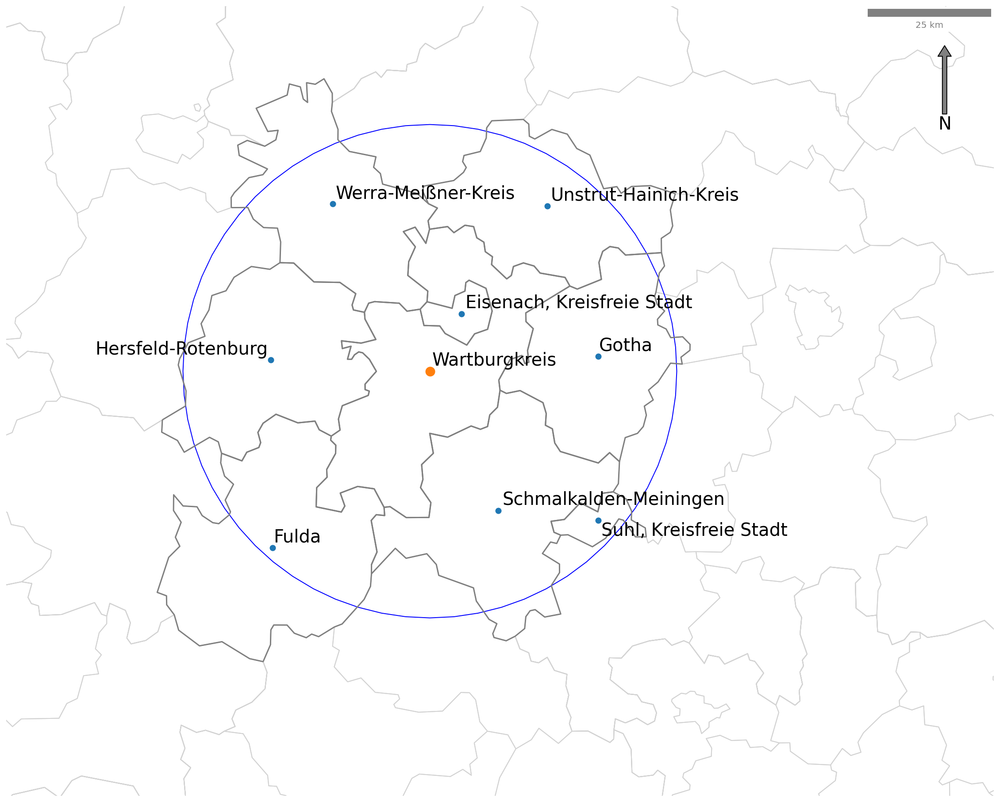

In [50]:
from matplotlib_scalebar.scalebar import ScaleBar

fig, ax = plt.subplots(figsize=(20, 20))
nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')
poly[poly['NUTS_ID'] == 'DEG0P'].plot(ax=ax, fc='none', edgecolor='blue')
points[points['NUTS_ID'].isin(wartburg)].plot(ax=ax)
points[points['NUTS_ID'] == 'DEG0P'].plot(ax=ax, markersize=100)


nuts[nuts['NUTS_ID'].isin(wartburg)].plot(ax=ax, fc='none', edgecolor='grey', lw=1.5)

ax.set_xlim(4250000,4450000)
ax.set_ylim(3000000,3160000)


texts=[]

for x, y, label in zip(points[points['NUTS_ID'].isin(wartburg)].centroid.x, 
                       points[points['NUTS_ID'].isin(wartburg)].centroid.y, 
                       points[points['NUTS_ID'].isin(wartburg)].NAME_LATN):
                        texts.append(plt.text(x, y, label, fontsize = 20))
        
adjust_text(texts)#, arrowprops=dict(arrowstyle="->", color='r', lw=0.5))  



ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
ax.axis('off')


plt.show()
                                          

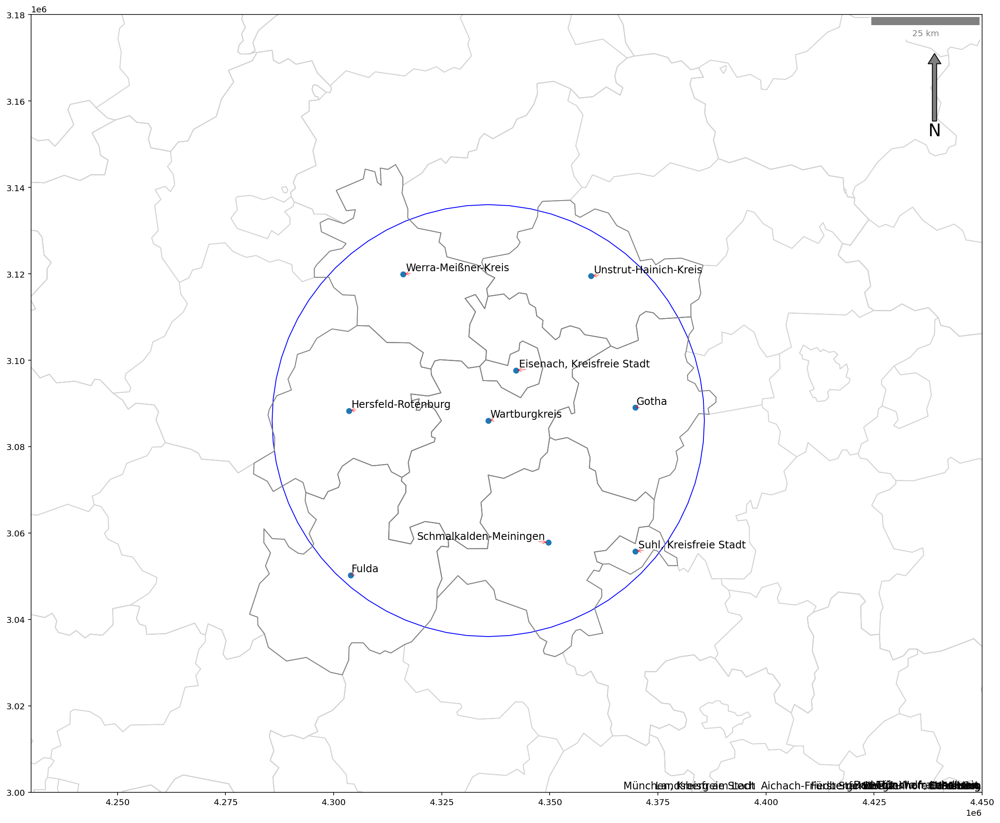

In [14]:
from adjustText import adjust_text
from matplotlib_scalebar.scalebar import ScaleBar



fig, ax = plt.subplots(figsize=(20, 20))
nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')
nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'darkgrey', ax=ax)
poly[poly['NUTS_ID'] == 'DEG0P'].plot(ax=ax, fc='none', edgecolor='blue')
points[points['NUTS_ID'].isin(wartburg)].plot(ax=ax)
nuts[nuts['NUTS_ID'].isin(wartburg)].plot(ax=ax, fc='none', edgecolor='grey')

poly[poly['NUTS_ID'] == 'DE212'].plot(ax=ax, fc='none', edgecolor='blue')
points[points['NUTS_ID'].isin(munich)].plot(ax=ax)
nuts[nuts['NUTS_ID'].isin(munich)].plot(ax=ax, fc='none', edgecolor='grey')

ax.set_xlim(4230000,4450000)
ax.set_ylim(3000000,3180000)

nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'grey', ax=ax)


texts=[]

for x, y, label in zip(points[(points['NUTS_ID'].isin(wartburg)) | (points['NUTS_ID'].isin(munich))].centroid.x, 
                       points[(points['NUTS_ID'].isin(wartburg)) | (points['NUTS_ID'].isin(munich))].centroid.y, 
                       points[(points['NUTS_ID'].isin(wartburg)) | (points['NUTS_ID'].isin(munich))].NAME_LATN):
                        texts.append(plt.text(x, y, label, fontsize = 12))
adjust_text(texts)#, arrowprops=dict(arrowstyle="->", color='r', lw=0.5))  

ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
# ax.axis('off')


plt.show()
               


In [178]:
# Create subset for testing purposes
wuppertal= join_left_df['NUTS_ID_right'].loc[(join_left_df['NUTS_ID_left'] == 'DEA1A') & (~join_left_df['NUTS_ID_right'].isin(['DE', 'DEA1A']))]

In [214]:
wuppertal = wuppertal[wuppertal.str.len()==5]

In [179]:
# Create subset for testing purposes
koln= join_left_df['NUTS_ID_right'].loc[(join_left_df['NUTS_ID_left'] == 'DEA23') & (~join_left_df['NUTS_ID_right'].isin(['DE', 'DEA23']))]

In [180]:
# Create subset for testing purposes
duisburg= join_left_df['NUTS_ID_right'].loc[(join_left_df['NUTS_ID_left'] == 'DEA12') & (~join_left_df['NUTS_ID_right'].isin(['DE', 'DEA12']))]

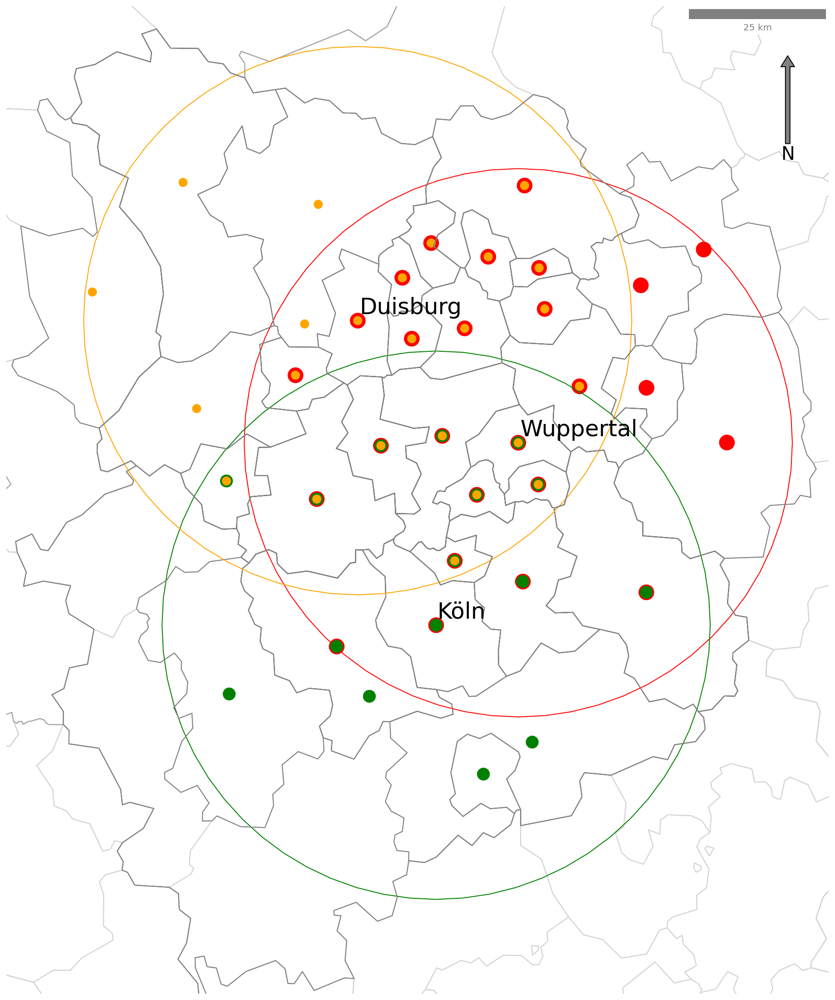

In [220]:
from adjustText import adjust_text
from matplotlib_scalebar.scalebar import ScaleBar



fig, ax = plt.subplots(figsize=(20, 20))


nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')
nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'darkgrey', ax=ax)

poly[poly['NUTS_ID'] == 'DEA1A'].plot(ax=ax, fc='none', edgecolor='red')
points[points['NUTS_ID'].isin(wuppertal)].plot(ax=ax, ec='none', fc='red', markersize=300)
points[points['NUTS_ID'] == 'DEA1A'].plot(ax=ax, ec='none', fc='red', markersize=300)


nuts[nuts['NUTS_ID'].isin(wuppertal)].plot(ax=ax, fc='none', edgecolor='grey')

poly[poly['NUTS_ID'] == 'DEA23'].plot(ax=ax, fc='none', edgecolor='green')
points[points['NUTS_ID'].isin(koln)].plot(ax=ax,ec='none', fc='green', markersize=200)
points[points['NUTS_ID'] == 'DEA23'].plot(ax=ax, ec='none', fc='green', markersize=200)
nuts[nuts['NUTS_ID'].isin(koln)].plot(ax=ax, fc='none', edgecolor='grey')

poly[poly['NUTS_ID'] == 'DEA12'].plot(ax=ax, fc='none', edgecolor='orange')
points[points['NUTS_ID'].isin(duisburg)].plot(ax=ax, ec='none', fc='orange', markersize=100)
points[points['NUTS_ID'] == 'DEA12'].plot(ax=ax, ec='none', fc='orange', markersize=100)
nuts[nuts['NUTS_ID'].isin(duisburg)].plot(ax=ax, fc='none', edgecolor='grey')

ax.set_xlim(4030000,4180000)
ax.set_ylim(3030000,3210000)

texts=[]

for x, y, label in zip(points[points['NUTS_ID'].isin(['DEA1A', 'DEA23', 'DEA12'])].centroid.x, 
                       points[points['NUTS_ID'].isin(['DEA1A', 'DEA23', 'DEA12'])].centroid.y, 
#                        points[points['NUTS_ID'].isin(['DEA1A', 'DEA23', 'DEA12'])].NAME_LATN):
                       ['Wuppertal', 'Köln', 'Duisburg']):
                        texts.append(plt.text(x, y, label, fontsize = 25))
                       


adjust_text(texts)  


ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
ax.axis('off')


plt.show()

In [213]:
wuppertal[wuppertal.str.len()==5]

7844    DEA27
7845    DEA23
7846    DEA2A
7847    DEA2B
7848    DEA24
7849    DEA1D
7850    DEA19
7851    DEA18
7852    DEA11
7854    DEA58
7855    DEA1C
7856    DEA53
7857    DEA56
7858    DEA14
7859    DEA16
7860    DEA13
7862    DEA12
7864    DEA51
7865    DEA52
7866    DEA17
7867    DEA55
7868    DEA32
7869    DEA5C
7870    DEA31
7871    DEA36
Name: NUTS_ID_right, dtype: object

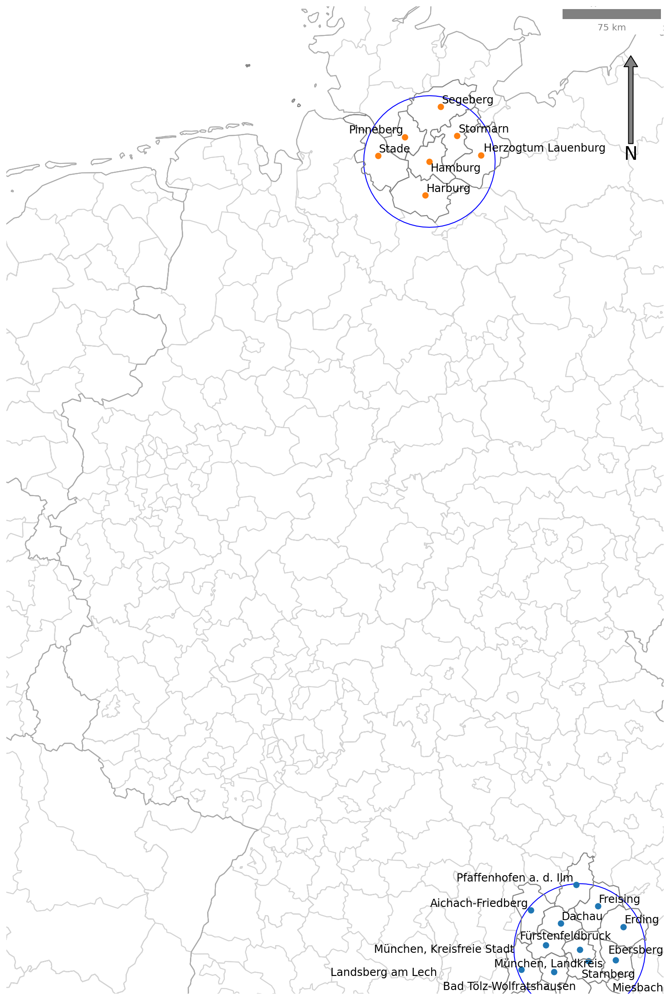

In [10]:
from adjustText import adjust_text
from matplotlib_scalebar.scalebar import ScaleBar



fig, ax = plt.subplots(figsize=(20, 20))


nuts.plot(ax=ax, fc='none', edgecolor='lightgrey')
nuts[nuts['LEVL_CODE'] == 0].plot(fc='none', ec= 'darkgrey', ax=ax)

poly[poly['NUTS_ID'] == 'DE212'].plot(ax=ax, fc='none', edgecolor='blue')
points[points['NUTS_ID'].isin(munich)].plot(ax=ax)
nuts[nuts['NUTS_ID'].isin(munich)].plot(ax=ax, fc='none', edgecolor='grey')

poly[poly['NUTS_ID'] == 'DE600'].plot(ax=ax, fc='none', edgecolor='blue')
points[points['NUTS_ID'].isin(hamburg)].plot(ax=ax)
nuts[nuts['NUTS_ID'].isin(hamburg)].plot(ax=ax, fc='none', edgecolor='grey')

ax.set_xlim(4000000,4500000)
ax.set_ylim(2750000,3500000)

texts=[]



for x, y, label in zip(points[(points['NUTS_ID'].isin(munich)) | (points['NUTS_ID'].isin(hamburg))].centroid.x, 
                       points[(points['NUTS_ID'].isin(munich)) | (points['NUTS_ID'].isin(hamburg))].centroid.y, 
                       points[(points['NUTS_ID'].isin(munich)) | (points['NUTS_ID'].isin(hamburg))].NAME_LATN):
                        texts.append(plt.text(x, y, label, fontsize = 12))
                       

adjust_text(texts)  


ax.add_artist(ScaleBar(1, color='grey', length_fraction=.2))

x, y, arrow_length = 0.95, 0.95, 0.1
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length),
            arrowprops=dict(facecolor='grey', width=5, headwidth=15),
            ha='center', va='center', fontsize=20,
            xycoords=ax.transAxes)
ax.axis('off')


plt.show()

### Scenario 1

- no terminal at either or both sides
- no connection, i.e. no supply
- Deduplicated where to and from meet al criteria

In [123]:

finaltotal_g_dest_g[(finaltotal_g_dest_g['from terminal'].isnull()) | (finaltotal_g_dest_g['to terminal'].isnull())]

temp = finaltotal_g_dest_g[(finaltotal_g_dest_g['to terminal'].isnull()) | (finaltotal_g_dest_g['from terminal'].isnull())]

temp = temp[temp['R2RCapacity'].isnull()].sort_values('R2RPotential there', ascending=False)

temp['dup'] = temp['R2RPotential there'] + temp['R2RPotential return']

temp = temp[temp['dup'].isnull() | ~temp[temp['dup'].notnull()].duplicated(subset='dup',keep='first')]

In [132]:
temp[temp['P2PEuclDistance (mtr)'] > 200000].to_excel('/Users/maartenk/Downloads/Scenario1_grt200k_noduplicates_nosupply.xlsx')

In [154]:
1506*1506

2268036

In [155]:
finaltotal_g_dest_g.shape

(40074, 22)

In [95]:
terms

,key_0,NUTS_ID_left,NAME_LATN_left,centroid,index_right,NUTS_ID_right,NAME_LATN_right,Platz,Alternative
0,BG,BG,Bulgaria,POINT (5561655.097 2310162.234),968,BG344,Stara Zagora,NaN,NaN
1,BG,BG,Bulgaria,POINT (5561655.097 2310162.234),0,BG,Bulgaria,NaN,NaN
2,BG,BG,Bulgaria,POINT (5561655.097 2310162.234),893,BG322,Gabrovo,NaN,NaN
3,CH,CH,Schweiz/Suisse/Svizzera,POINT (4185526.077 2633624.417),830,CH062,Uri,NaN,NaN
4,CH,CH,Schweiz/Suisse/Svizzera,POINT (4185526.077 2633624.417),1,CH,Schweiz/Suisse/Svizzera,NaN,NaN
...,...,...,...,...,...,...,...,...,...
13547,SHHL,SHHL,Seehafen Lübeck,POINT (4377309.118 3426464.227),1148,SHHL,Seehafen Lübeck,Lübeck Seehafen,Luebeck Seehafen
13548,SHHRO,SHHRO,Seehafen Rostock,POINT (4458470.735 3450058.709),13128,SHHRO,Seehafen Rostock,Rostock Seehafen,Rostock Seehafen
13549,SHANT,SHANT,Seehafen Antwerpen,POINT (3924185.325 3148765.550),24228,SHANT,Seehafen Antwerpen,NaN,NaN
13550,SHWHV,SHWHV,Seehafen Wilhelmshaven,POINT (4198365.834 3388447.216),3528,SHWHV,Seehafen Wilhelmshaven,NaN,NaN


In [96]:
cargo

,RegionTo,RegionFrom,ZoneTo,ZoneFrom,NutsCodeTo,NutsCodeFrom,cargocode,AnnualCargoCapacity
0,Alb-Donau-Kreis,Emilia-Romagna,08425,26397,DE145,ITD5,2639708425,135000
1,Alb-Donau-Kreis,"Köln, Kreisfreie Stadt",08425,05315,DE145,DEA23,0531508425,67500
2,Alb-Donau-Kreis,Seehafen Bremerhaven,08425,04128,DE145,SHBH,0412808425,225000
3,Alb-Donau-Kreis,Seehafen Hamburg,08425,02118,DE145,SHHH,0211808425,675000
4,"Altötting, Landkreis","München, Landeshauptstadt, Kreisfreie Stadt",09171,09162,DE214,DE212,0916209171,225000
...,...,...,...,...,...,...,...,...
548,"Wuppertal, Kreisfreie Stadt","Nürnberg, Kreisfreie Stadt",05124,09564,DEA1A,DE254,0956405124,45000
549,"Wuppertal, Kreisfreie Stadt",Posen,05124,28431,DEA1A,PL41,2843105124,270000
550,Zeeland,"Osnabrück, Kreisfreie Stadt",24147,03404,NL34,DE944,0340424147,67500
551,Zentral-Frankreich,"Duisburg, Kreisfreie Stadt",25157,05112,FR96,DEA12,0511225157,90000


In [99]:
scenario2 = cargo.merge(df, left_on = cargo['NutsCodeFrom'], right_on =  'NUTS code from', how = 'left')

In [105]:
scenario2 = scenario2.merge(df, left_on = scenario2['NutsCodeTo'], right_on =  'NUTS code from', how = 'left')

In [108]:
scenario2[(scenario2['Platz_x'].isnull()) | (scenario2['Platz_y'].isnull()) ]

,NUTS code from,RegionTo,RegionFrom,ZoneTo,ZoneFrom,NutsCodeTo,NutsCodeFrom,cargocode,AnnualCargoCapacity,Zone from_x,NUTS code from_x,NUTS region from_x,Platz_x,Alternative_x,Zone from_y,NUTS code from_y,NUTS region from_y,Platz_y,Alternative_y
0,DE145,Alb-Donau-Kreis,Emilia-Romagna,08425,26397,DE145,ITD5,2639708425,135000,NaN,ITD5,NaN,NaN,NaN,8425.0,DE145,Alb-Donau-Kreis,Dornstadt,Dornstadt
6,BE21,Antwerpen,Antwerpen,24271,24271,BE21,BE21,2427124271,67500,NaN,BE21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,BE21,Antwerpen,"Duisburg, Kreisfreie Stadt",24271,05112,BE21,DEA12,0511224271,135000,5112.0,DEA12,"Duisburg, Kreisfreie Stadt",Duisburg Ruhrort / Rheinhausen / Hohenbudberg,Duisburg Ruhrort / Rheinhausen / Hohenbudberg,NaN,NaN,NaN,NaN,NaN
8,BE21,Antwerpen,"Frankfurt (Oder), Kreisfreie Stadt",24271,12053,BE21,DE403,1205324271,225000,12053.0,DE403,"Frankfurt (Oder), Kreisfreie Stadt",Frankfurt (Oder),Frankfurt (Oder),NaN,NaN,NaN,NaN,NaN
9,BE21,Antwerpen,"Ludwigshafen am Rhein, Kreisfreie Stadt",24271,07314,BE21,DEB34,0731424271,112500,7314.0,DEB34,"Ludwigshafen am Rhein, Kreisfreie Stadt",Ludwigshafen KTL / Hafen,Ludwigshafen KTL / Hafen,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545,DEA1A,"Wuppertal, Kreisfreie Stadt",Emilia-Romagna,05124,26397,DEA1A,ITD5,2639705124,225000,NaN,ITD5,NaN,NaN,NaN,5124.0,DEA1A,"Wuppertal, Kreisfreie Stadt",Wuppertal Langerfeld,Wuppertal Langerfeld
549,DEA1A,"Wuppertal, Kreisfreie Stadt",Posen,05124,28431,DEA1A,PL41,2843105124,270000,NaN,PL41,NaN,NaN,NaN,5124.0,DEA1A,"Wuppertal, Kreisfreie Stadt",Wuppertal Langerfeld,Wuppertal Langerfeld
550,NL34,Zeeland,"Osnabrück, Kreisfreie Stadt",24147,03404,NL34,DE944,0340424147,67500,3404.0,DE944,"Osnabrück, Kreisfreie Stadt",Osnabrück,Osnabrueck,NaN,NaN,NaN,NaN,NaN
551,FR96,Zentral-Frankreich,"Duisburg, Kreisfreie Stadt",25157,05112,FR96,DEA12,0511225157,90000,5112.0,DEA12,"Duisburg, Kreisfreie Stadt",Duisburg Ruhrort / Rheinhausen / Hohenbudberg,Duisburg Ruhrort / Rheinhausen / Hohenbudberg,NaN,NaN,NaN,NaN,NaN


In [110]:
scenario2

,NUTS code from,RegionTo,RegionFrom,ZoneTo,ZoneFrom,NutsCodeTo,NutsCodeFrom,cargocode,AnnualCargoCapacity,Zone from_x,NUTS code from_x,NUTS region from_x,Platz_x,Alternative_x,Zone from_y,NUTS code from_y,NUTS region from_y,Platz_y,Alternative_y
0,DE145,Alb-Donau-Kreis,Emilia-Romagna,08425,26397,DE145,ITD5,2639708425,135000,NaN,ITD5,NaN,NaN,NaN,8425.0,DE145,Alb-Donau-Kreis,Dornstadt,Dornstadt
1,DE145,Alb-Donau-Kreis,"Köln, Kreisfreie Stadt",08425,05315,DE145,DEA23,0531508425,67500,5315.0,DEA23,"Köln, Kreisfreie Stadt",Köln Eifeltor / Niehl,Koeln Eifeltor / Niehl,8425.0,DE145,Alb-Donau-Kreis,Dornstadt,Dornstadt
2,DE145,Alb-Donau-Kreis,Seehafen Bremerhaven,08425,04128,DE145,SHBH,0412808425,225000,4128.0,SHBH,Seehafen Bremerhaven,Bremerhaven Seehafen,Bremerhaven Seehafen,8425.0,DE145,Alb-Donau-Kreis,Dornstadt,Dornstadt
3,DE145,Alb-Donau-Kreis,Seehafen Hamburg,08425,02118,DE145,SHHH,0211808425,675000,2118.0,SHHH,Seehafen Hamburg,Hamburg Seehafen,Hamburg Seehafen,8425.0,DE145,Alb-Donau-Kreis,Dornstadt,Dornstadt
4,DE214,"Altötting, Landkreis","München, Landeshauptstadt, Kreisfreie Stadt",09171,09162,DE214,DE212,0916209171,225000,9162.0,DE212,"München, Landeshauptstadt, Kreisfreie Stadt",München DUSS,Muenchen DUSS,9171.0,DE214,"Altötting, Landkreis",Burghausen,Burghausen
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,DEA1A,"Wuppertal, Kreisfreie Stadt","Nürnberg, Kreisfreie Stadt",05124,09564,DEA1A,DE254,0956405124,45000,9564.0,DE254,"Nürnberg, Kreisfreie Stadt",Nürnberg Hafen,Neurenberg Hafen,5124.0,DEA1A,"Wuppertal, Kreisfreie Stadt",Wuppertal Langerfeld,Wuppertal Langerfeld
549,DEA1A,"Wuppertal, Kreisfreie Stadt",Posen,05124,28431,DEA1A,PL41,2843105124,270000,NaN,PL41,NaN,NaN,NaN,5124.0,DEA1A,"Wuppertal, Kreisfreie Stadt",Wuppertal Langerfeld,Wuppertal Langerfeld
550,NL34,Zeeland,"Osnabrück, Kreisfreie Stadt",24147,03404,NL34,DE944,0340424147,67500,3404.0,DE944,"Osnabrück, Kreisfreie Stadt",Osnabrück,Osnabrueck,NaN,NaN,NaN,NaN,NaN
551,FR96,Zentral-Frankreich,"Duisburg, Kreisfreie Stadt",25157,05112,FR96,DEA12,0511225157,90000,5112.0,DEA12,"Duisburg, Kreisfreie Stadt",Duisburg Ruhrort / Rheinhausen / Hohenbudberg,Duisburg Ruhrort / Rheinhausen / Hohenbudberg,NaN,NaN,NaN,NaN,NaN


In [111]:
df.shape

(86, 5)

In [112]:
df

,Zone from,NUTS code from,NUTS region from,Platz,Alternative
0,1004,DEF04,"Neumünster, Kreisfreie Stadt",Neumünster,Neumuenster
1,1138,SHKI,Seehafen Kiel,Kiel,Kiel
2,1148,SHHL,Seehafen Lübeck,Lübeck Seehafen,Luebeck Seehafen
3,2000,DE6,Hamburg,Hamburg Billwerder,Hamburg Billwerder
4,2118,SHHH,Seehafen Hamburg,Hamburg Seehafen,Hamburg Seehafen
...,...,...,...,...,...
81,16068,DEG0D,"Sömmerda, Kreis",Kölleda,Koelleda
82,26232,AT32,Salzburg,Salzburg (AT),Salzburg (AT)
83,26234,AT34,Vorarlberg,Wolfurt (AT),Wolfurt (AT)
84,22101,DK1,Ost-Dänemark,Padborg (DK),Padborg (DK)


In [121]:
scenario2a = finaltotal_g_dest_g[finaltotal_g_dest_g['P2PCapacity'].isnull()]

In [124]:
scenario2a = finaltotal_g_dest_g.merge(df, left_on = finaltotal_g_dest_g['hinternuts'], right_on =  'NUTS code from', how = 'left')

In [126]:
scenario2a = scenario2a.merge(df, left_on = scenario2a['servicenuts'], right_on =  'NUTS code from', how = 'left')

In [127]:
scenario2a[(scenario2a['Platz_x'].notnull()) | (scenario2a['Platz_y'].notnull()) ]

,NUTS code from,hintername,servicename,R2RPotential there,R2RPotential return,R2RCapacity,From Region Capacity,P2PActForecast,P2PPotential,P2PCapacity,...,Zone from_x,NUTS code from_x,NUTS region from_x,Platz_x,Alternative_x,Zone from_y,NUTS code from_y,NUTS region from_y,Platz_y,Alternative_y
2,DEF04,"Flensburg, Kreisfreie Stadt","Neumünster, Kreisfreie Stadt",294766.0,336049.0,NaN,225000.0,14106.0,5269.0,NaN,...,NaN,DEF01,NaN,NaN,NaN,1004.0,DEF04,"Neumünster, Kreisfreie Stadt",Neumünster,Neumuenster
13,DE6,"Flensburg, Kreisfreie Stadt",Hamburg,307739.0,330905.0,NaN,270000.0,37434.0,4813.0,NaN,...,NaN,DEF01,NaN,NaN,NaN,2000.0,DE6,Hamburg,Hamburg Billwerder,Hamburg Billwerder
14,SHHH,"Flensburg, Kreisfreie Stadt",Seehafen Hamburg,379980.0,NaN,NaN,225000.0,649159.0,323155.0,NaN,...,NaN,DEF01,NaN,NaN,NaN,2118.0,SHHH,Seehafen Hamburg,Hamburg Seehafen,Hamburg Seehafen
16,DE939,"Flensburg, Kreisfreie Stadt","Stade, Landkreis",105637.0,231080.0,NaN,450000.0,111.0,47.0,NaN,...,NaN,DEF01,NaN,NaN,NaN,3359.0,DE939,"Stade, Landkreis",Stade,Stade
18,DEF04,"Kiel, Kreisfreie Stadt","Neumünster, Kreisfreie Stadt",2201256.0,2192261.0,NaN,225000.0,46771.0,15028.0,NaN,...,NaN,DEF02,NaN,NaN,NaN,1004.0,DEF04,"Neumünster, Kreisfreie Stadt",Neumünster,Neumuenster
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39987,DE261,Mazowiecki regionalny,"Aschaffenburg, Kreisfreie Stadt",118459.0,NaN,NaN,NaN,8355.0,4002.0,NaN,...,NaN,PL92,NaN,NaN,NaN,9661.0,DE261,"Aschaffenburg, Kreisfreie Stadt",Aschaffenburg,Aschaffenburg
39988,DE300,Mazowiecki regionalny,Stadt Berlin,128986.0,NaN,NaN,NaN,123614.0,32851.0,NaN,...,NaN,PL92,NaN,NaN,NaN,11000.0,DE300,Stadt Berlin,Berlin Westhafen,Berlin Westhafen
39989,DE403,Mazowiecki regionalny,"Frankfurt (Oder), Kreisfreie Stadt",142485.0,NaN,NaN,NaN,6985.0,1835.0,NaN,...,NaN,PL92,NaN,NaN,NaN,12053.0,DE403,"Frankfurt (Oder), Kreisfreie Stadt",Frankfurt (Oder),Frankfurt (Oder)
39991,DE406,Mazowiecki regionalny,"Dahme-Spreewald, Landkreis",161894.0,NaN,NaN,NaN,24420.0,7268.0,NaN,...,NaN,PL92,NaN,NaN,NaN,12061.0,DE406,"Dahme-Spreewald, Landkreis",Königs Wusterhausen,Koenigs Wusterhausen


In [8]:
!pip freeze

adjustText==0.7.3
appnope @ file:///home/conda/feedstock_root/build_artifacts/appnope_1649077682618/work
argon2-cffi @ file:///home/conda/feedstock_root/build_artifacts/argon2-cffi_1640817743617/work
argon2-cffi-bindings @ file:///Users/runner/miniforge3/conda-bld/argon2-cffi-bindings_1649500375223/work
asttokens @ file:///home/conda/feedstock_root/build_artifacts/asttokens_1618968359944/work
attrs @ file:///home/conda/feedstock_root/build_artifacts/attrs_1640799537051/work
autopep8==1.6.0
backcall @ file:///home/conda/feedstock_root/build_artifacts/backcall_1592338393461/work
backports.functools-lru-cache @ file:///home/conda/feedstock_root/build_artifacts/backports.functools_lru_cache_1618230623929/work
beautifulsoup4 @ file:///home/conda/feedstock_root/build_artifacts/beautifulsoup4_1649463573192/work
bleach @ file:///home/conda/feedstock_root/build_artifacts/bleach_1656355450470/work
branca @ file:///home/conda/feedstock_root/build_artifacts/branca_1650311966802/work
brotlipy @ fil